In [1]:
import os

# Path to the dataset directory
dataset_path = "/kaggle/input/spine-generation-sample-data"

# Count the number of files in the dataset directory
num_files = sum([len(files) for r, d, files in os.walk(dataset_path)])

num_files

444

In [2]:
num_files/3

148.0

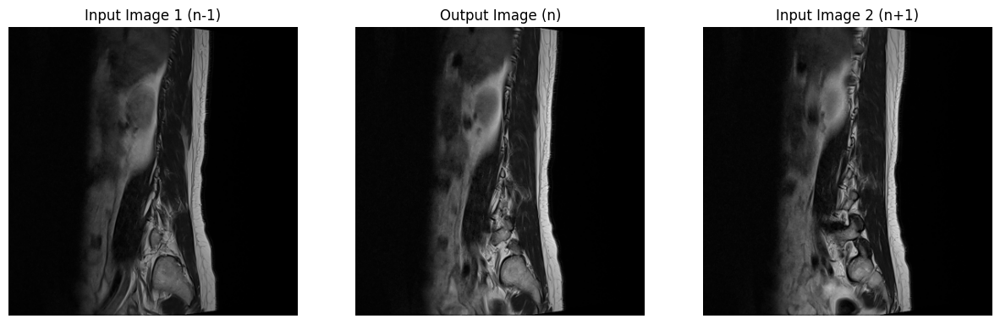

In [3]:
import os
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

# Custom dataset class
class SpineDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        
        # Get all files from the directory, assuming they are images
        self.image_files = sorted([f for f in os.listdir(root_dir) if os.path.isfile(os.path.join(root_dir, f))])


    def __len__(self):
        return len(self.image_files)//3

    def __getitem__(self, idx):
        # Construct file names for input and output
        input_image_1_name = os.path.join(self.root_dir, str(idx+1)+'_n-1.png')
        input_image_2_name = os.path.join(self.root_dir, str(idx+1)+'_n+1.png')
        output_image_name = os.path.join(self.root_dir, str(idx+1)+'_n.png')
        
        # Load images
        input_image_1 = Image.open(input_image_1_name).convert("RGB")
        input_image_2 = Image.open(input_image_2_name).convert("RGB")
        output_image = Image.open(output_image_name).convert("RGB")

        # Apply transformations if provided
        if self.transform:
            input_image_1 = self.transform(input_image_1)
            input_image_2 = self.transform(input_image_2)
            output_image = self.transform(output_image)

        return (input_image_1, input_image_2), output_image

# Dataset path
dataset_path = "/kaggle/input/spine-generation-sample-data"

# Define transforms to convert PIL images to PyTorch tensors
transform = transforms.Compose([
    transforms.Resize((369,369)),
    transforms.ToTensor(),
# Converts PIL Image to Tensor
])

# Initialize dataset and DataLoader
spine_dataset = SpineDataset(root_dir=dataset_path, transform=transform)
dataloader = DataLoader(spine_dataset, batch_size=1, shuffle=False)

# Iterate through DataLoader and display the first batch of images
first_batch = next(iter(dataloader))

# Unpack images from the first batch
input_images, output_image = first_batch

# Since batch size is 1, we need to get the first (and only) element from the batch
input_image_1 = input_images[0].squeeze() # Input image 1 (n-1)
input_image_2 = input_images[1].squeeze()  # Input image 2 (n+1)
output_image = output_image.squeeze(0)  # Remove the batch dimension

# Display the input and output images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(input_image_1.permute(1, 2, 0).numpy())  # Input image 1 (n-1)
axes[0].set_title('Input Image 1 (n-1)')
axes[0].axis('off')

axes[1].imshow(output_image.permute(1, 2, 0).numpy())  # Output image (n)
axes[1].set_title('Output Image (n)')
axes[1].axis('off')

axes[2].imshow(input_image_2.permute(1, 2, 0).numpy())  # Input image 2 (n+1)
axes[2].set_title('Input Image 2 (n+1)')
axes[2].axis('off')

plt.show()

In [4]:
import torch.nn as nn
# Generator
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Input is 6 channels (2 images, each with 3 channels)
            nn.ConvTranspose2d(6, 256, 7, 1, 0, bias=False),  # Output: 256 x 7 x 7
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),  # Output: 128 x 14 x 14
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),   # Output: 64 x 28 x 28
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 32, 3, 1, 1, bias=False),    # Output: 32 x 28 x 28
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.Conv2d(32, 3, 3, 1, 1, bias=False),              # Output: 3 x 28 x 28
            nn.ReLU(True),
            nn.Conv2d(3, 3, kernel_size=4, stride=2, padding=1),
            nn.ReLU(True),# Output: (1, 3, 750, 750)
            nn.Conv2d(3, 3, kernel_size=3, stride=2),
            nn.ReLU(True),# Output: (1, 3, 375, 375)
            nn.Conv2d(3, 3, kernel_size=3, stride=1),
            nn.ReLU(True),# Output: (1, 3, 375, 375) - keep size
            nn.Conv2d(3, 3, kernel_size=8, stride=1, padding=2),  # Output: (1, 3, 369, 369) - final resize
            nn.Tanh()
        )

    def forward(self, input_images):
        # Concatenate two input images along the channel dimension
        concatenated_input = torch.cat(input_images, dim=1)  # Concatenate on the channel dimension (C=6)
        return self.main(concatenated_input)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),    # Output: 64 x 14 x 14 (input is RGB)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),  # Output: 128 x 7 x 7
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 3, 1, 1, bias=False), # Output: 256 x 7 x 7
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 7, 1, 0, bias=False),   # Output: 1 x 1 x 1
            nn.Sigmoid(),  # Output will be between 0 and 1
            nn.Conv2d(1, 16, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),# Output: (1, 16, 43, 43)
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),# Output: (1, 32, 22, 22)
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1), 
            nn.LeakyReLU(0.2, inplace=True),# Output: (1, 64, 11, 11)
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),# Output: (1, 128, 6, 6)
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1), 
            nn.LeakyReLU(0.2, inplace=True),# Output: (1, 256, 3, 3)
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),# Output: (1, 512, 2, 2)
            nn.Conv2d(512, 1, kernel_size=2, stride=1),             # Output: (1, 1, 1, 1)
            nn.Flatten(),
            nn.Sigmoid()
            )

    def forward(self, x):
        return self.main(x)  # Output shape will be (batch_size, 1, 1, 1)

In [5]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
from torchvision.utils import save_image
from tqdm import tqdm
import matplotlib.pyplot as plt

# Training setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lr = 0.0002
beta1 = 0.5
num_epochs = 100  # Specify the number of epochs

# Initialize models
netG = Generator().to(device)
netD = Discriminator().to(device)

# Loss and Optimizer
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Dataset path
dataset_path = "/kaggle/input/spine-generation-sample-data"
transform = transforms.Compose([
    transforms.Resize((369, 369)),  # Resize to match generator input size
    transforms.ToTensor()  # Converts PIL Image to Tensor
])

# Labels for real and fake images
real_label = 1.
fake_label = 0.

In [6]:
def show_generated_images(epoch):
    img = plt.imread(f'/kaggle/working/generated_images/fake_samples_epoch_{epoch}.png')
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Epoch 1/100: 100%|██████████| 148/148 [01:00<00:00,  2.44batch/s, lossD=1.36, lossG=0.762]


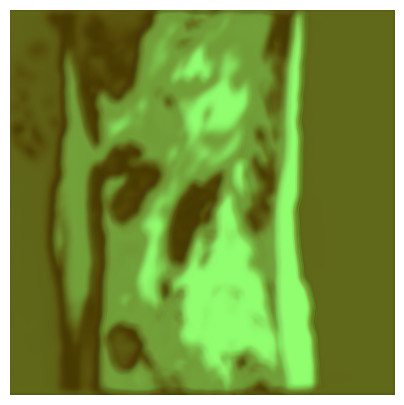

Epoch 2/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=0.00269, lossG=6.62]


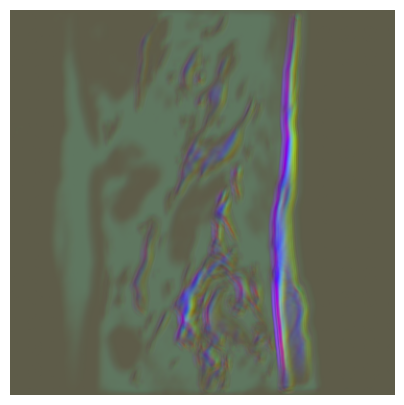

Epoch 3/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.32, lossG=0.76]


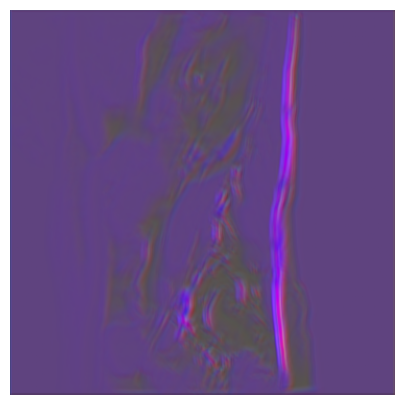

Epoch 4/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=0.00181, lossG=6.45]


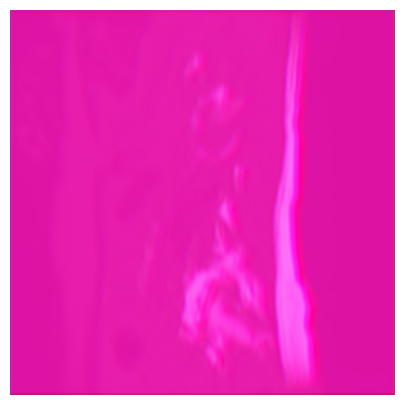

Epoch 5/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.37, lossG=0.734]


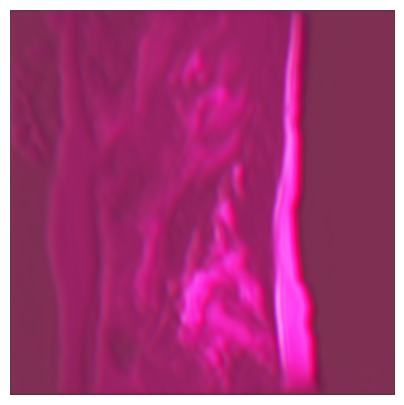

Epoch 6/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=0.00313, lossG=5.85]


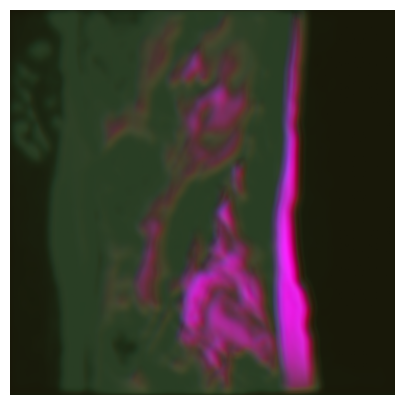

Epoch 7/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.39, lossG=0.693]


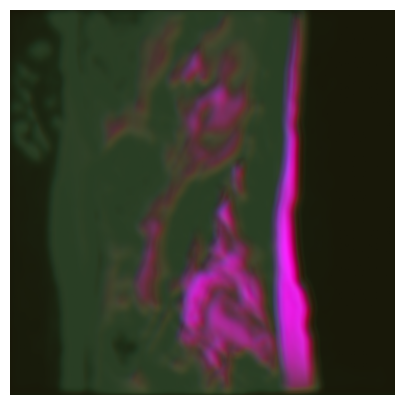

Epoch 8/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.39, lossG=0.693]


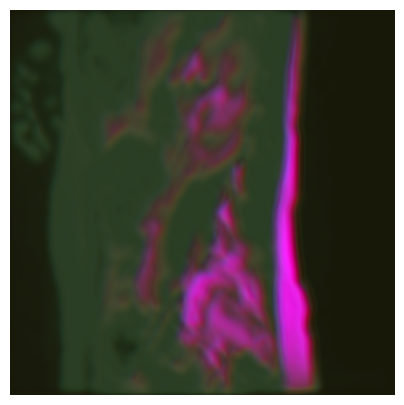

Epoch 9/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.39, lossG=0.693]


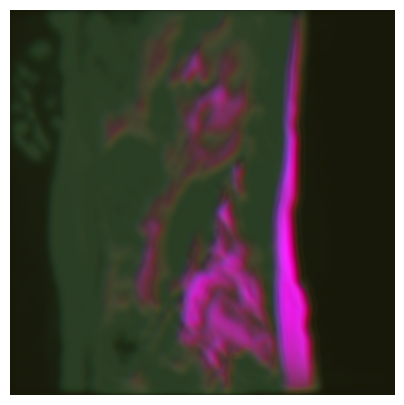

Epoch 10/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.39, lossG=0.693]


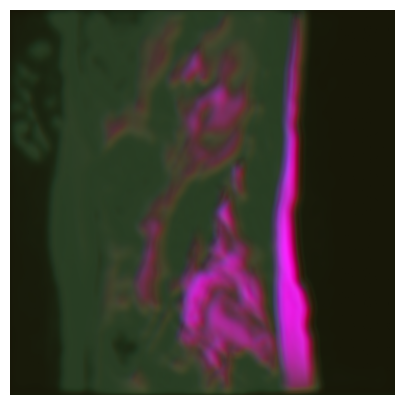

Epoch 11/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.39, lossG=0.693]


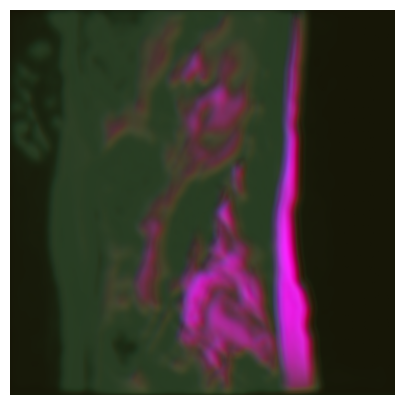

Epoch 12/100: 100%|██████████| 148/148 [00:59<00:00,  2.47batch/s, lossD=1.39, lossG=0.693]


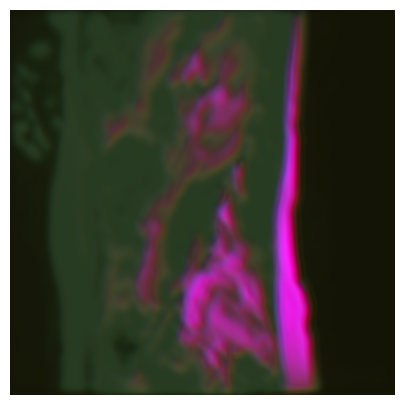

Epoch 13/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.699]


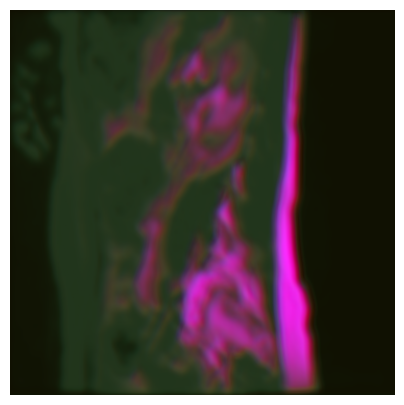

Epoch 14/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.746]


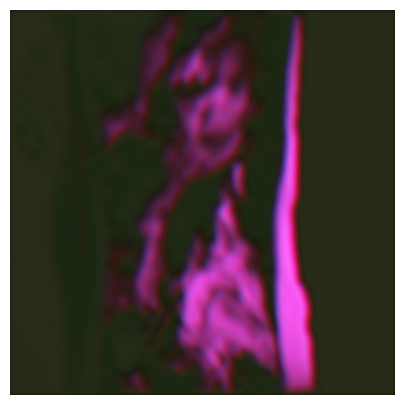

Epoch 15/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


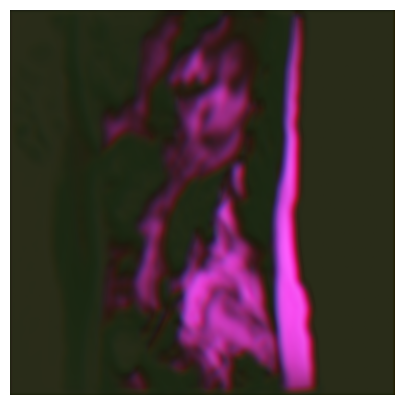

Epoch 16/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


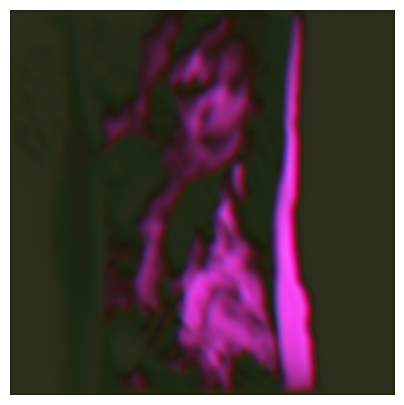

Epoch 17/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


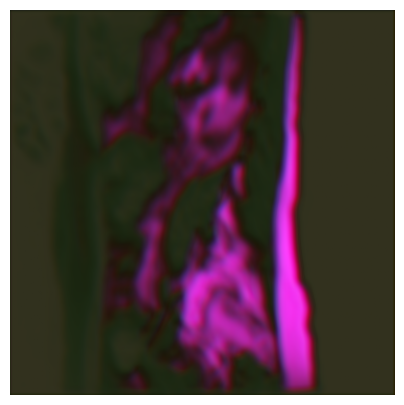

Epoch 18/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


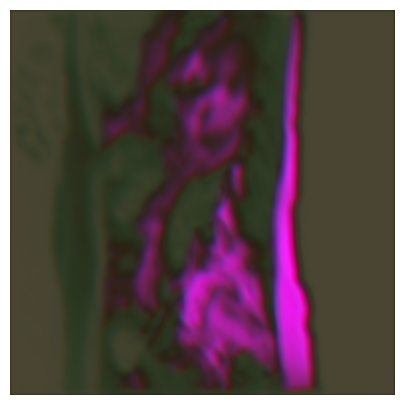

Epoch 19/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


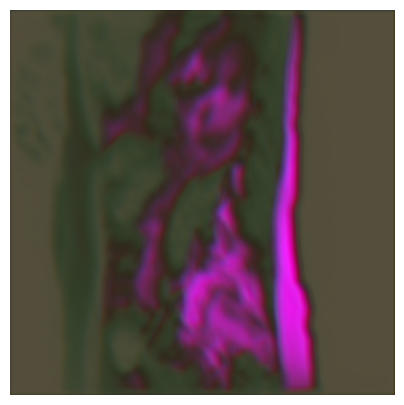

Epoch 20/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


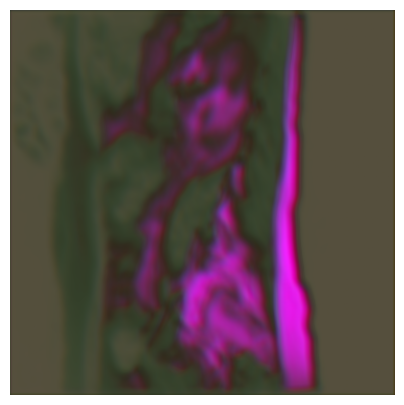

Epoch 21/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


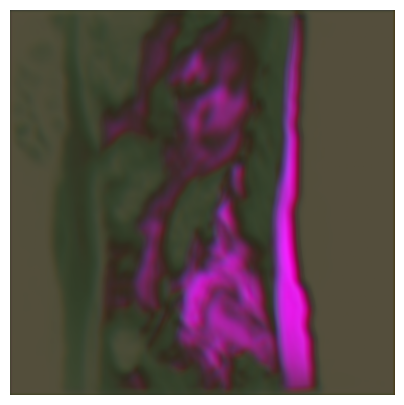

Epoch 22/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


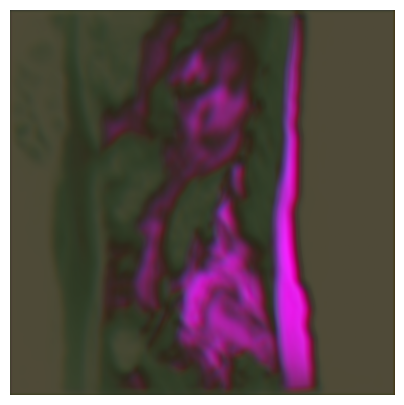

Epoch 23/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


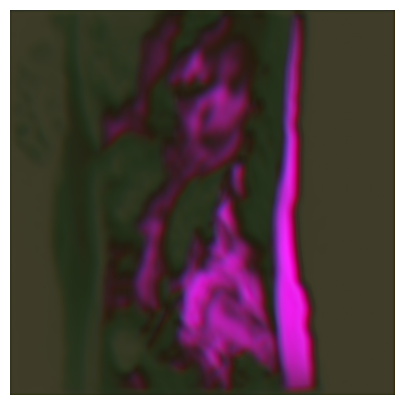

Epoch 24/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


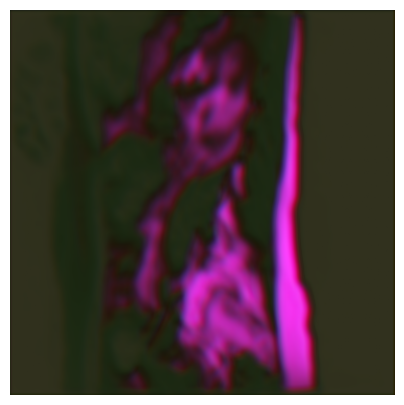

Epoch 25/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


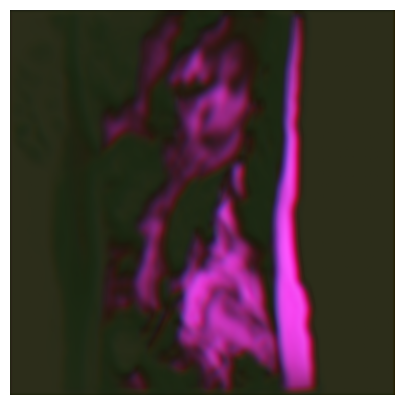

Epoch 26/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


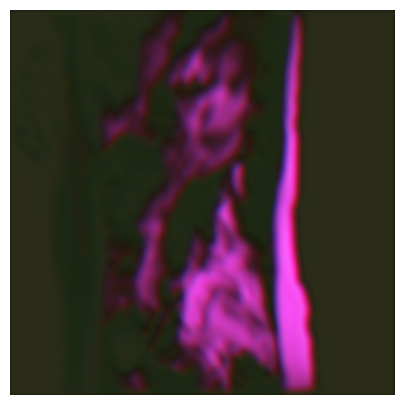

Epoch 27/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


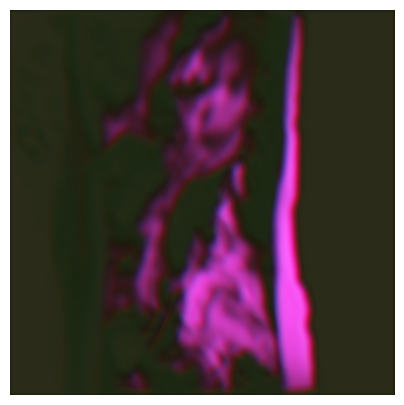

Epoch 28/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.33, lossG=0.664]


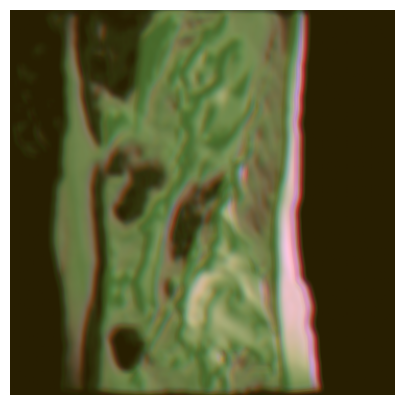

Epoch 29/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.24, lossG=0.81]


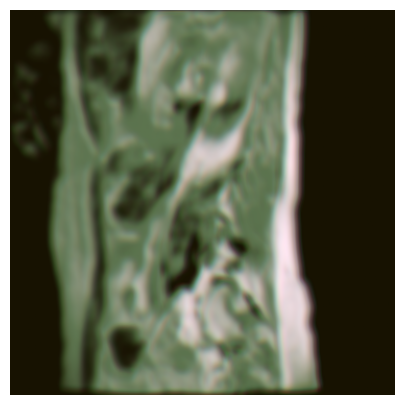

Epoch 30/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.41, lossG=0.71]


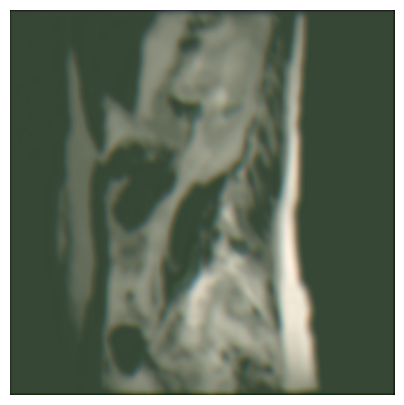

Epoch 31/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.66, lossG=1.42]


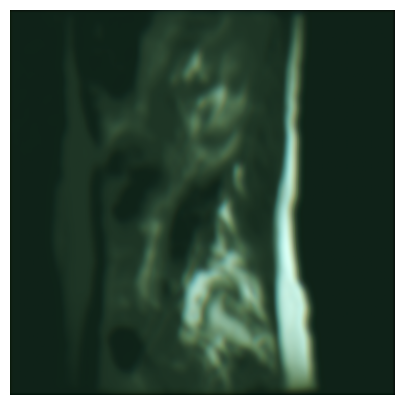

Epoch 32/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=0.269, lossG=2.77]


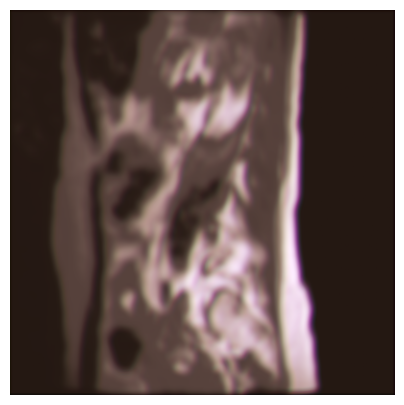

Epoch 33/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.718]


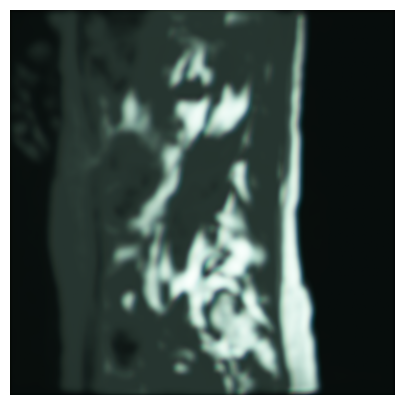

Epoch 34/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=0.28, lossG=1.91]


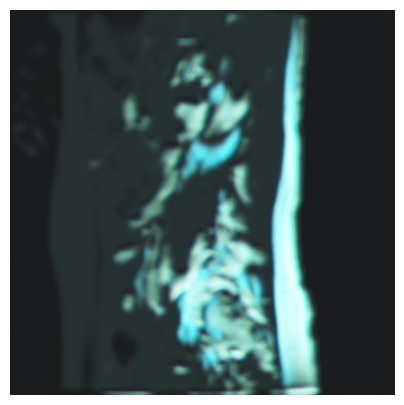

Epoch 35/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.44, lossG=0.729]


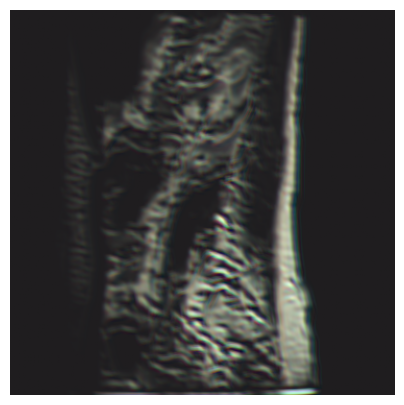

Epoch 36/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=0.103, lossG=3.64]


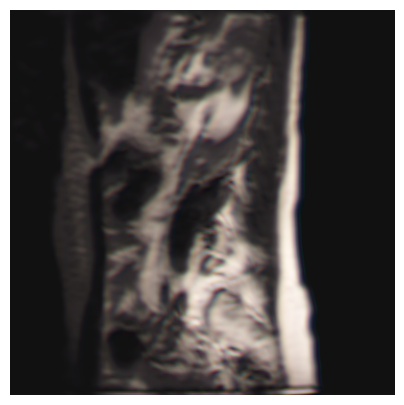

Epoch 37/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


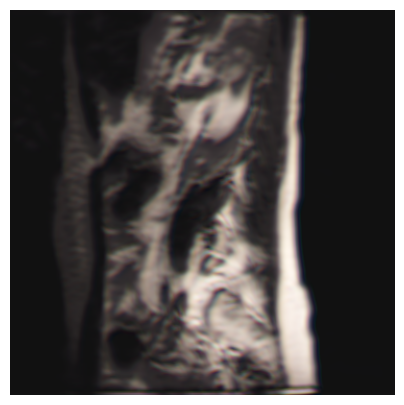

Epoch 38/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


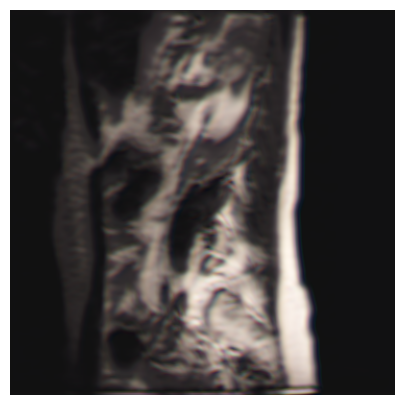

Epoch 39/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


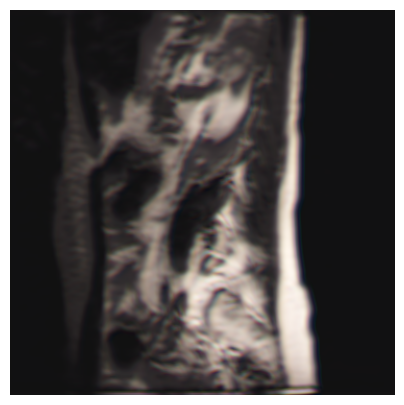

Epoch 40/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


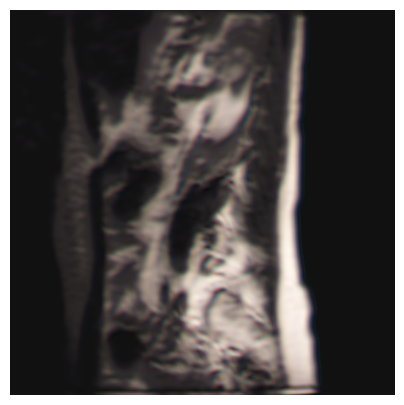

Epoch 41/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


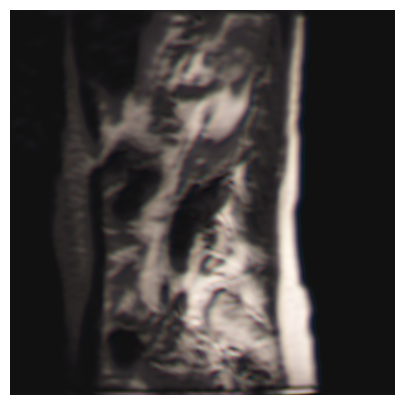

Epoch 42/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


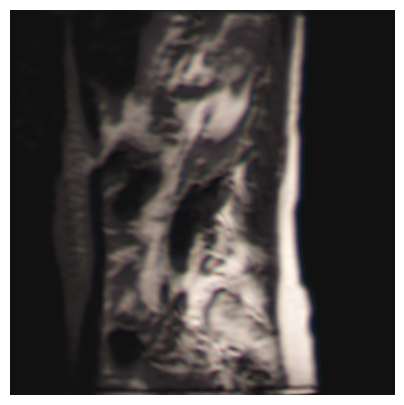

Epoch 43/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


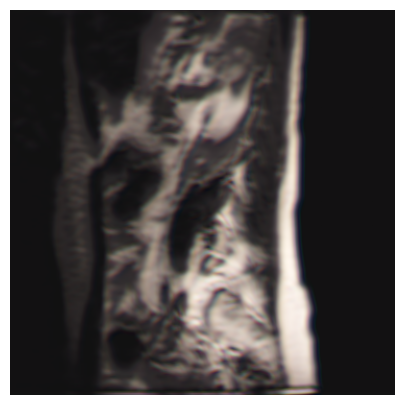

Epoch 44/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


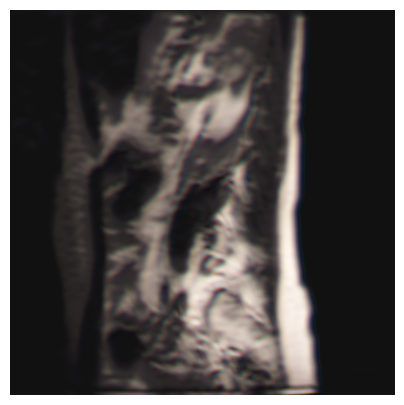

Epoch 45/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


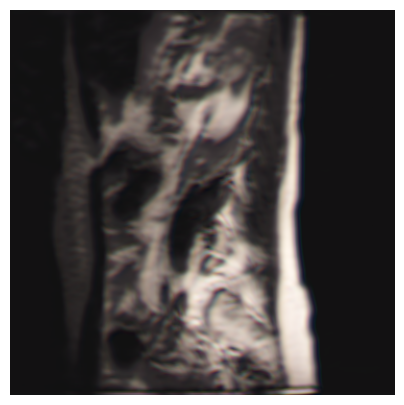

Epoch 46/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


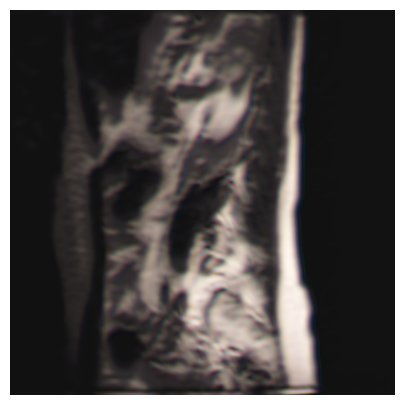

Epoch 47/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


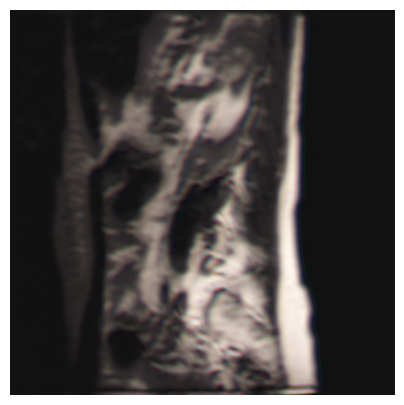

Epoch 48/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


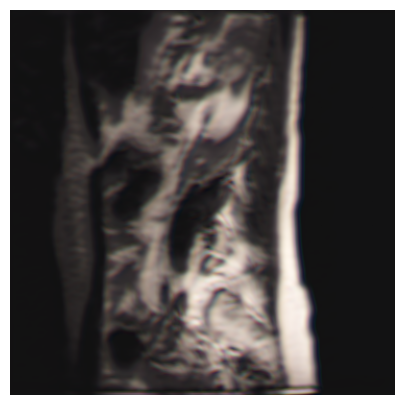

Epoch 49/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


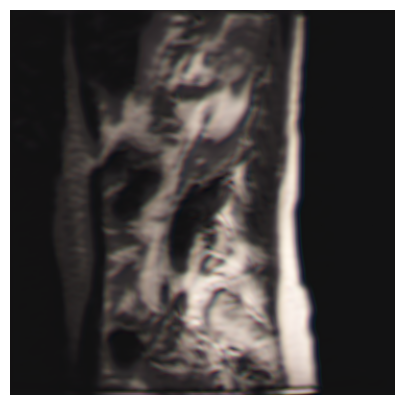

Epoch 50/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


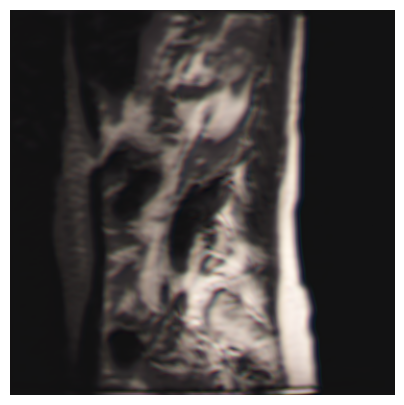

Epoch 51/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


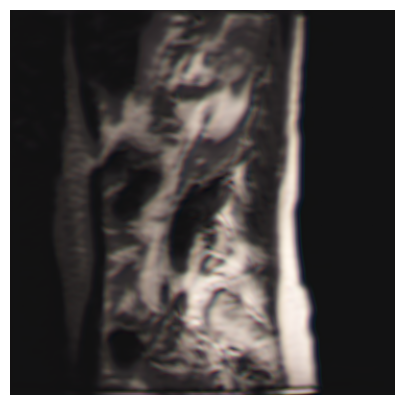

Epoch 52/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


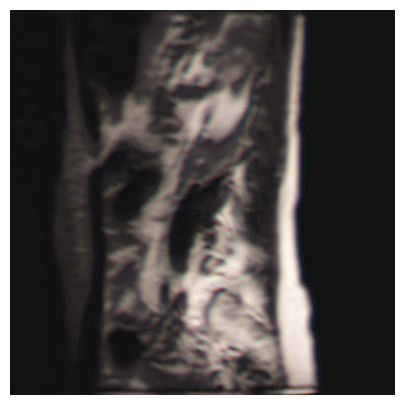

Epoch 53/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


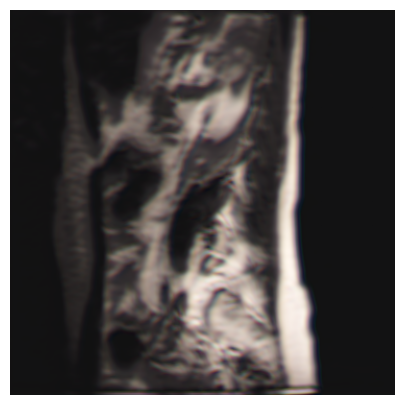

Epoch 54/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


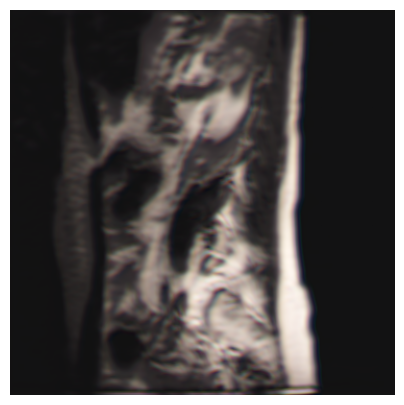

Epoch 55/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


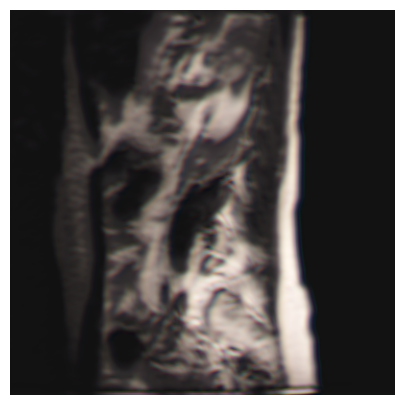

Epoch 56/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


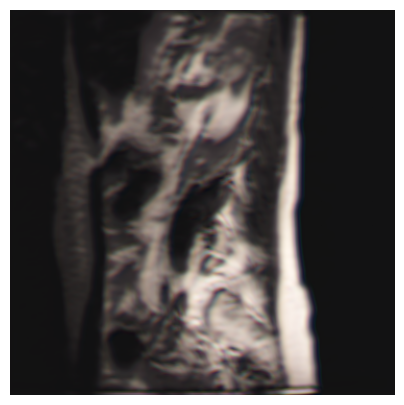

Epoch 57/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


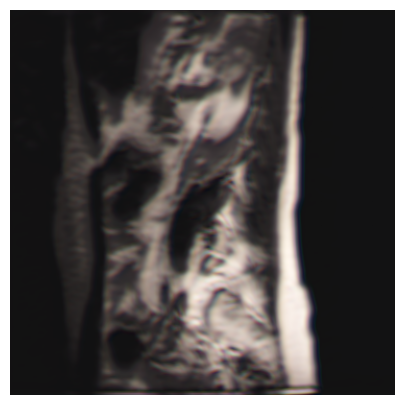

Epoch 58/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


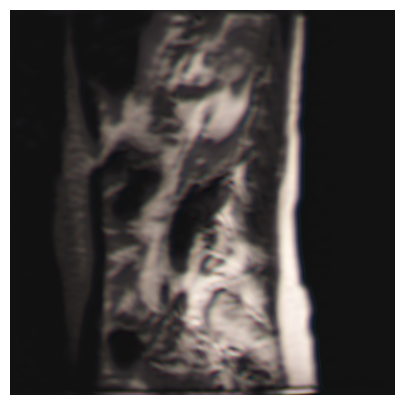

Epoch 59/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


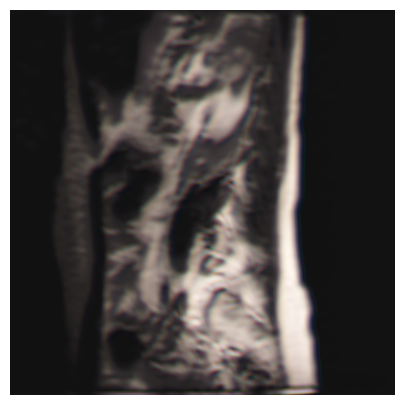

Epoch 60/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


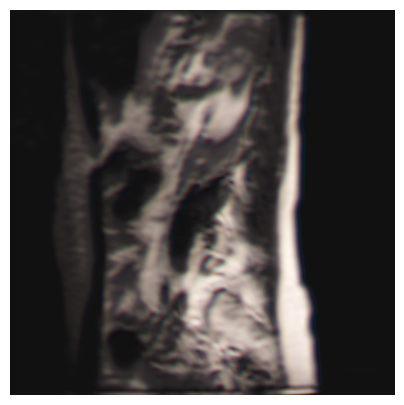

Epoch 61/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


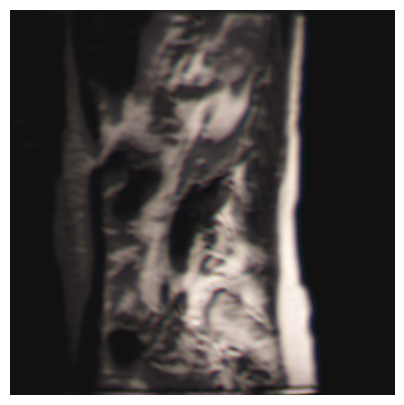

Epoch 62/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


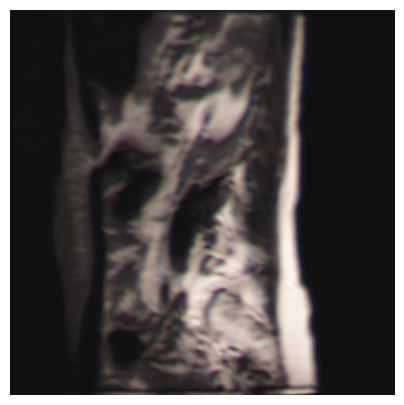

Epoch 63/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


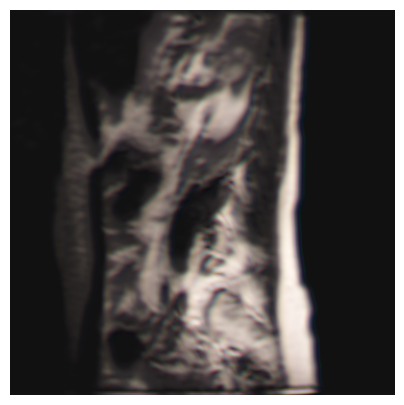

Epoch 64/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


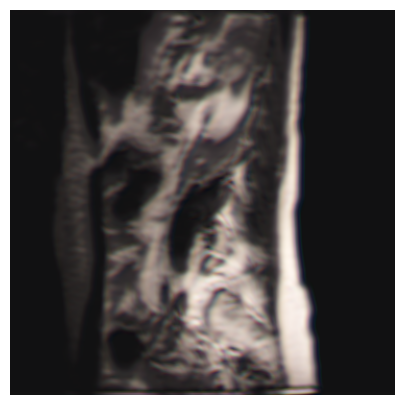

Epoch 65/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


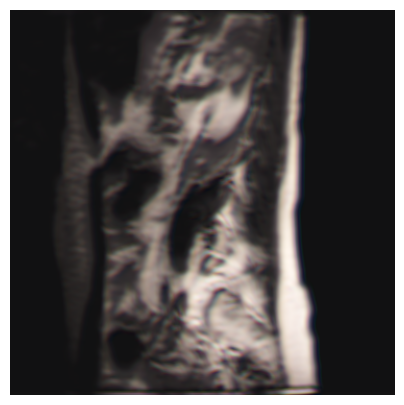

Epoch 66/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


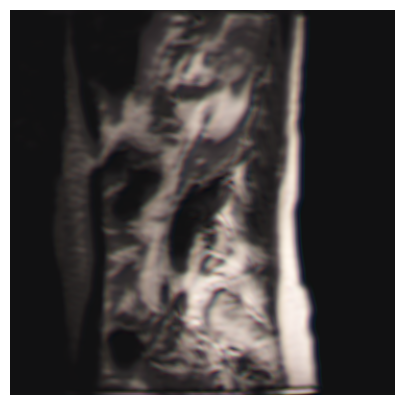

Epoch 67/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


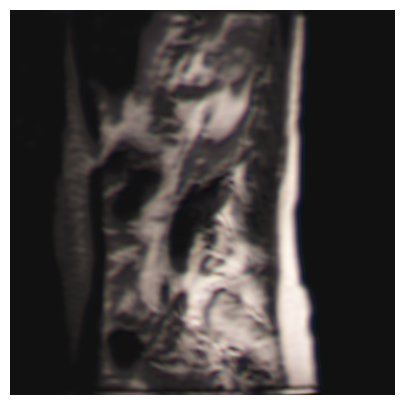

Epoch 68/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


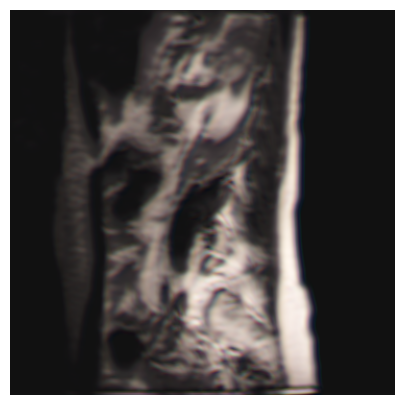

Epoch 69/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


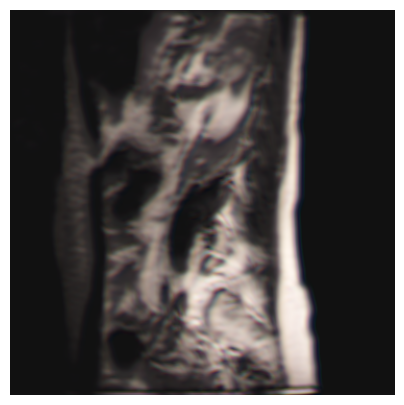

Epoch 70/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


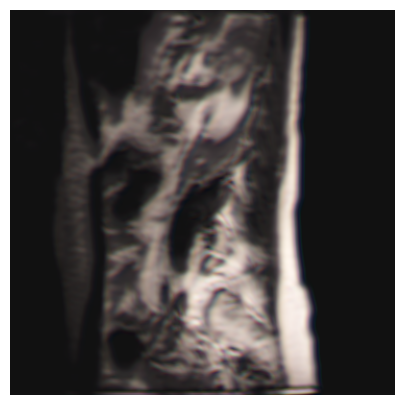

Epoch 71/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


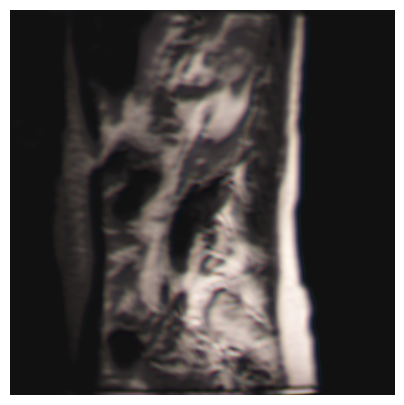

Epoch 72/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


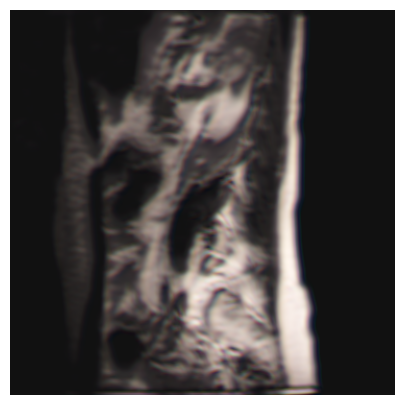

Epoch 73/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


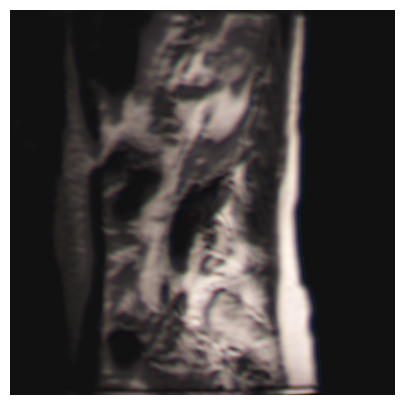

Epoch 74/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


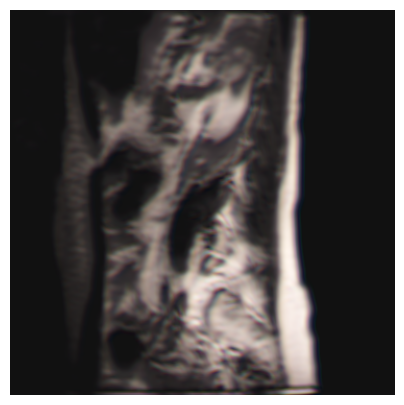

Epoch 75/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


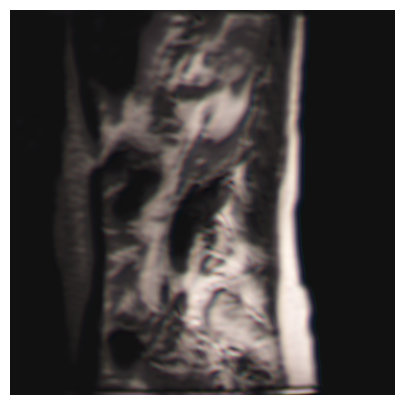

Epoch 76/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


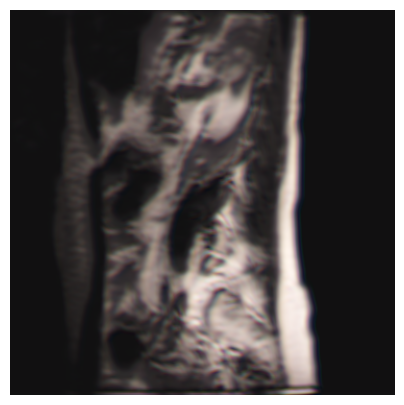

Epoch 77/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


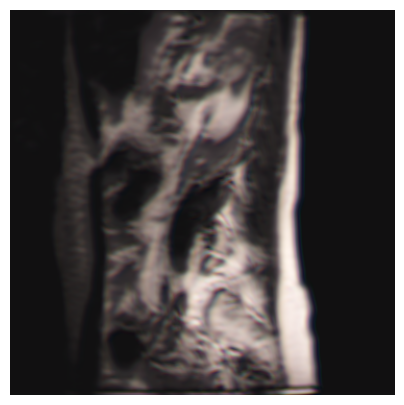

Epoch 78/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


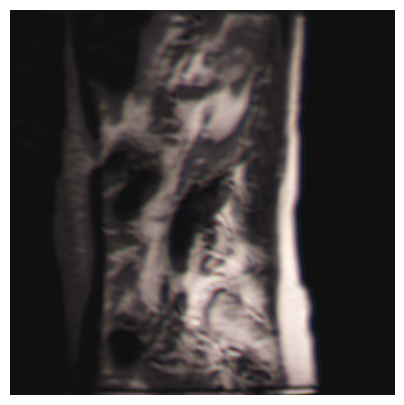

Epoch 79/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


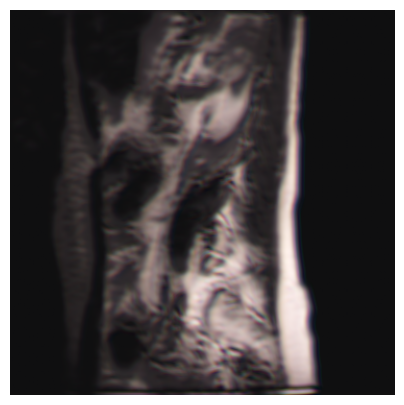

Epoch 80/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.695]


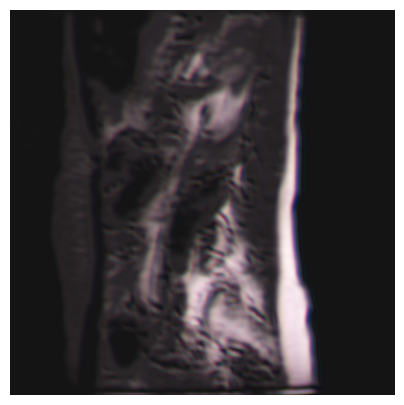

Epoch 81/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.38, lossG=0.694]


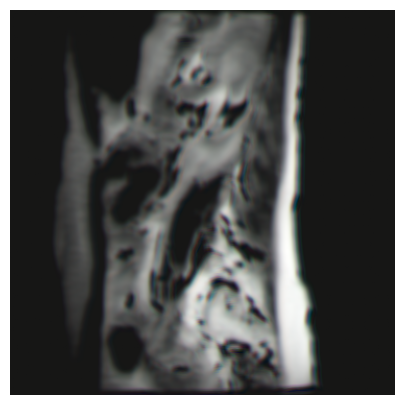

Epoch 82/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.63]


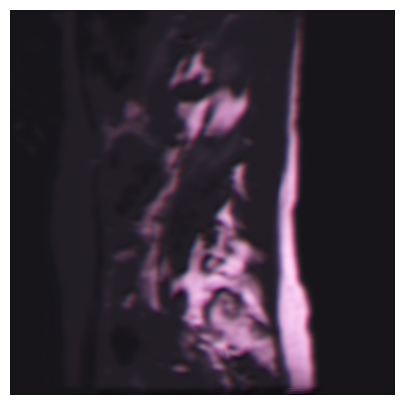

Epoch 83/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


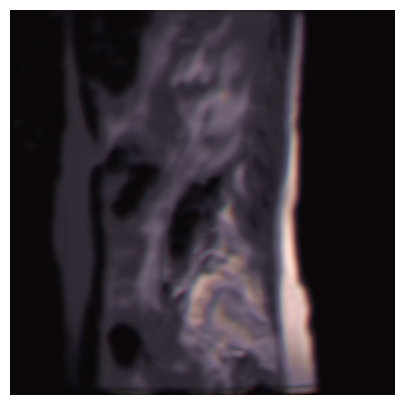

Epoch 84/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


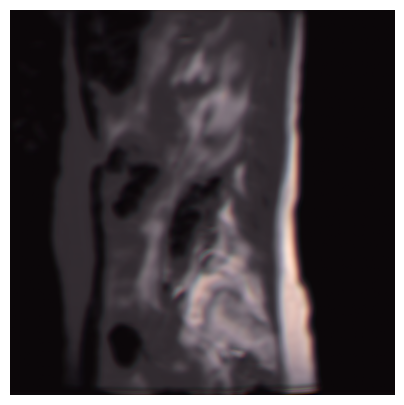

Epoch 85/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


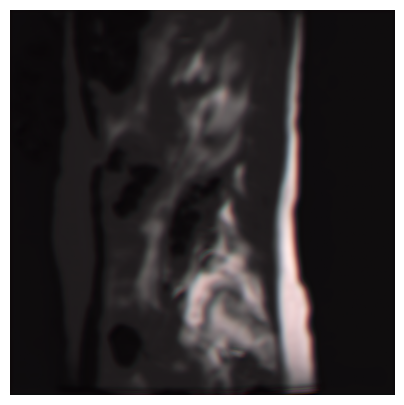

Epoch 86/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


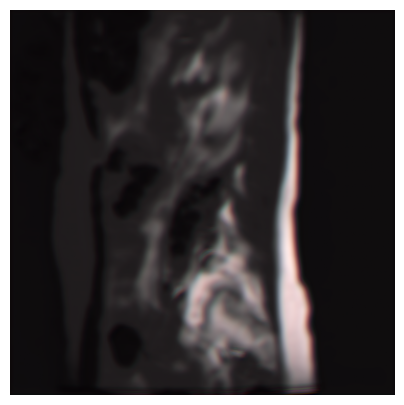

Epoch 87/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


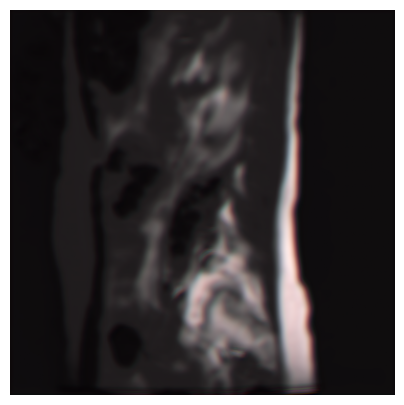

Epoch 88/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


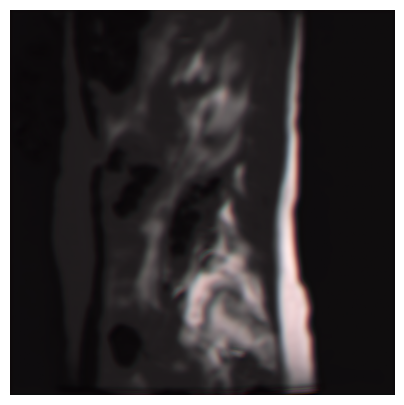

Epoch 89/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


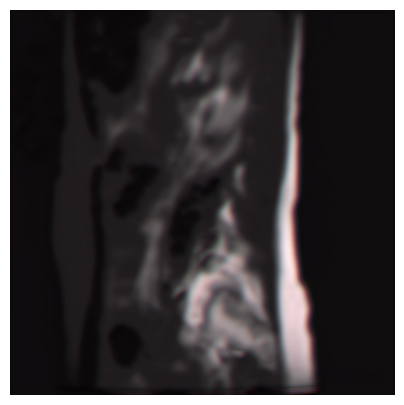

Epoch 90/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


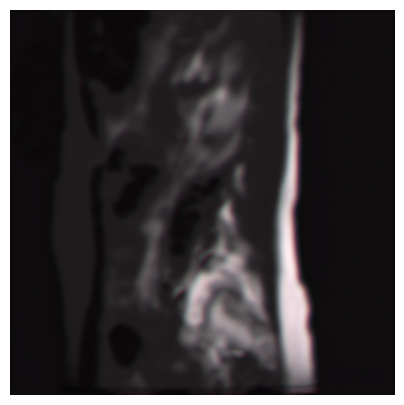

Epoch 91/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


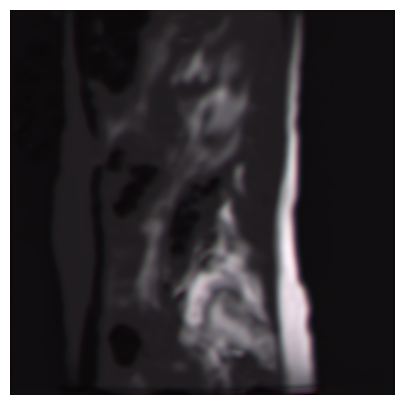

Epoch 92/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


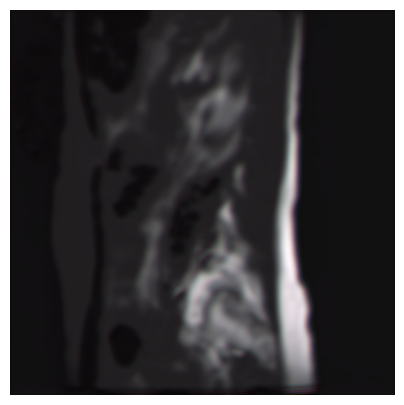

Epoch 93/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


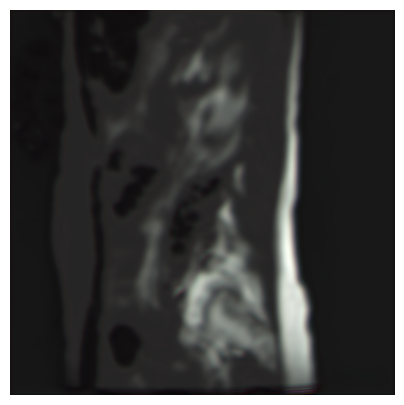

Epoch 94/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


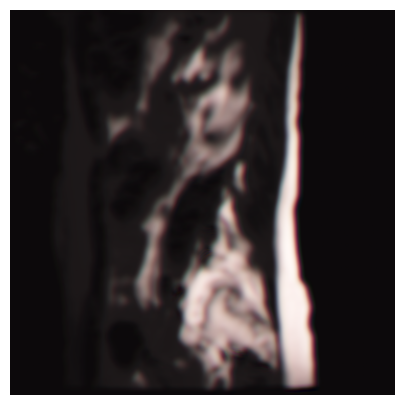

Epoch 95/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


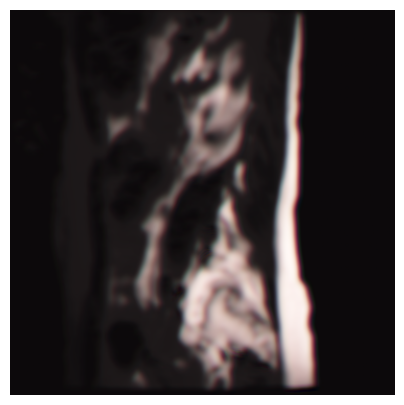

Epoch 96/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


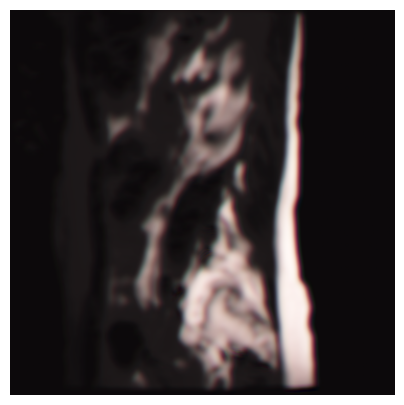

Epoch 97/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


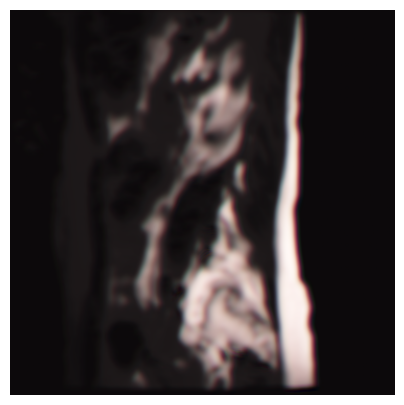

Epoch 98/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


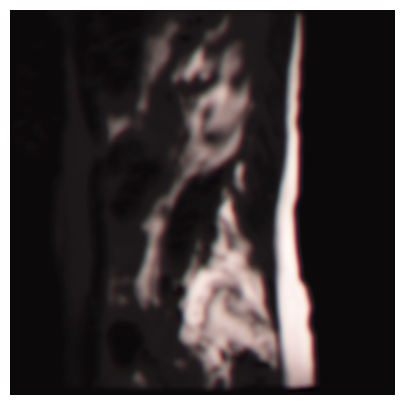

Epoch 99/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


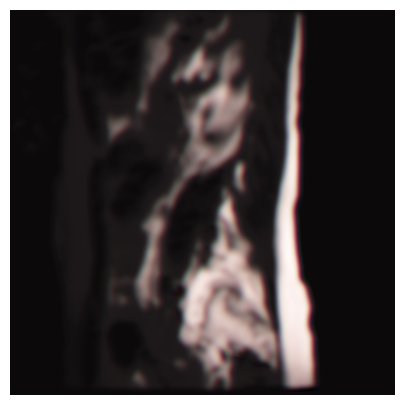

Epoch 100/100: 100%|██████████| 148/148 [00:59<00:00,  2.48batch/s, lossD=1.39, lossG=0.693]


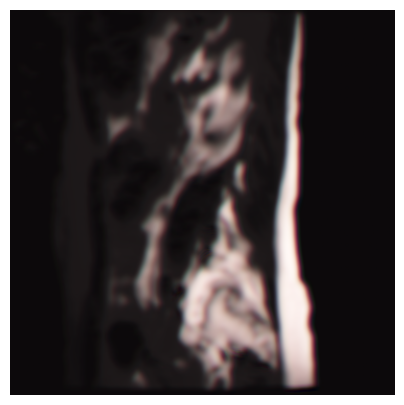

In [7]:
# Training loop
for epoch in range(num_epochs):
    with tqdm(enumerate(dataloader, 0), total=len(dataloader), desc=f'Epoch {epoch+1}/{num_epochs}', unit='batch') as tepoch:
        for i, data in tepoch:
            (input_image_1, input_image_2), output_image = data
            input_image_1, input_image_2, output_image = input_image_1.to(device), input_image_2.to(device), output_image.to(device)

            # Combine input images for generator input
            #combined_input = torch.cat((input_image_1, input_image_2), dim=1)  # Concatenate along channel dimension

            # Update Discriminator with real images
            netD.zero_grad()
            labels = torch.full((1,), real_label, dtype=torch.float, device=device)
            output = netD(output_image).view(-1)
            #print("real")
            #print(output_image.shape)
            #print(labels)
            #print(output)
            lossD_real = criterion(output, labels)
            lossD_real.backward()

            # Update Discriminator with fake images
            fake_image = netG((input_image_1, input_image_2))  # Generate fake image
            labels.fill_(fake_label)
            output = netD(fake_image.detach()).view(-1)
            #print("fake")
            #print(fake_image.shape)
            #print(output,labels)
            lossD_fake = criterion(output, labels)
            lossD_fake.backward()
            optimizerD.step()

            # Update Generator
            netG.zero_grad()
            labels.fill_(real_label)
            output = netD(fake_image).view(-1)
            lossG = criterion(output, labels)
            lossG.backward()
            optimizerG.step()

            # Update progress bar with current losses
            if i % 100 == 0:
                tepoch.set_postfix(lossD=lossD_real.item() + lossD_fake.item(), lossG=lossG.item())
                

        # Save generated images
        if not os.path.exists('generated_images'):
            os.makedirs('generated_images')
        save_image(fake_image.data, f'generated_images/fake_samples_epoch_{epoch}.png', nrow=5, normalize=True)
        
        show_generated_images(epoch)

In [8]:
# Save the model
model_save_path = "generator_model.pth"
generator = Generator()
torch.save(generator.state_dict(), model_save_path)
print("Model saved successfully!")

# Load the model
loaded_generator = Generator()
loaded_generator.load_state_dict(torch.load(model_save_path))
loaded_generator.eval()  # Set to evaluation mode
print("Model loaded successfully!")

Model saved successfully!
Model loaded successfully!


/tmp/ipykernel_23/283187590.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loaded_generator.load_state_dict(torch.load(model_save_path))
